Apply CellRank to MEF reprogramming
---
CellRank application to in vitro reprogramming data of MEFs to induced endoderm progenitors, see [Biddy et al., Nature 2018](https://www.nature.com/articles/s41586-018-0744-4). Compare to ground-truth fate probabiliteis given by CellTagging lineage tracing labels. 

# Preliminaries

## Import packages

Import packages

In [1]:
# import standard packages
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt
import seaborn as sns

import os
import sys

# import single-cell packages
import scanpy as sc
import scanpy.external as sce
import scvelo as scv
import cellrank as cr

# set verbosity levels
sc.settings.verbosity = 2
cr.settings.verbosity = 2
scv.settings.verbosity = 3 

## Print package versions for reproducibility

If you want to exactly reproduce the results shown here, please make sure that your package versions match what is printed below. 

In [2]:
cr.logging.print_versions()

cellrank==1.5.0+g65f1562 scanpy==1.8.1 anndata==0.7.6 numpy==1.20.3 numba==0.54.0 scipy==1.7.1 pandas==1.3.3 pygpcca==1.0.2 scikit-learn==0.24.2 statsmodels==0.13.0rc0 python-igraph==0.9.1 scvelo==0.2.4 pygam==0.8.0 matplotlib==3.4.3 seaborn==0.11.2


In [3]:
cr.logging.print_version_and_date()

Running CellRank 1.5.0+g65f1562, on 2021-10-26 14:47.


## Set up paths

Define the paths to load data, cache results and write figure panels.

In [4]:
sys.path.insert(0, "../../")  # this depends on the notebook depth and must be adapted per notebook

from paths import DATA_DIR, CACHE_DIR, FIG_DIR

In [5]:
# we're only saving into one directory, so let's make life a little simpler
FIG_DIR = FIG_DIR / "fig_4_reprogramming"

Set up the paths to save figures.

In [6]:
scv.settings.figdir = str(FIG_DIR)
sc.settings.figdir = str(FIG_DIR)
cr.settings.figdir = str(FIG_DIR)

## Set up caching

Note: we use a caching extension called `scachepy` for this analysis, see [here](https://github.com/theislab/scachepy). We do this to speed up the runtime of this notebook by avoiding the most expensive computations. Below, we check whether you have scachepy installed and if you don't, then we automatically recompute all results. 

In [7]:
try:
    import scachepy
    c = scachepy.Cache(CACHE_DIR / "mef_reprogramming", separate_dirs=True)
    print('Sucessfully imported scachepy. Expensive computations will be cached. ')
except ImportError:
    print('Failed to import scachepy. Consider installing it from `https://github.com/theislab/scachepy`. ')
    c = None
    
use_caching = c is not None
c

Sucessfully imported scachepy. Expensive computations will be cached. 


Cache(root=/Users/marius/Projects/cellrank_reproducibility_2/cache/mef_reprogramming, ext='.pickle', compression='None')

## Set global parameters

Set some plotting parameters.

In [8]:
scv.settings.set_figure_params('scvelo', dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map='viridis')
scv.settings.plot_prefix = ""

Set other global parameters

In [9]:
# should figures just be displayed or also saved?
save_figure = True

# should cashed values be used, or recompute?
force_recompute = False

If there are other global parameters for this analysis, put them here as well. 

## Define utility functions

In [10]:
from typing import Optional, Sequence, Iterable
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from anndata import AnnData

Use fate probabilities to predict reprogramming outcome, compare with ground truth labels and quanitfy agreement with area under ROC curve. 

In [11]:
def predict_reprogramming_outcome(adata: AnnData, 
                                  day_key: str = 'reprogramming_day',
                                  day_selection: Optional[Sequence] = None,
                                  binary_label_key: str = 'reprogramming',
                                  predictor_key: str = 'reprogramming_probability', 
                                  random_state: int = 0, 
                                  figsize: Optional[Iterable[float]] = None, 
                                  lw: float = 2, 
                                  save: Optional[str] = None):
    """
    Predict reprogramming outcome for a subset of labelled cells given fate probabilities. 
    
    Given a subset of days from the reprogramming timecourse, treat the clonal information as ground-truth
    binary labels in a classification task in which we predict reprogramming outcome based on fate probabilities 
    using logistic regression. Data is subsampled so that sucessful/dead-end classes are balanced and split
    into train/test sets. Classification is evaluated using ROC curves. Note that cells used to define the terminal
    states are always removed from training/test sets. 
    
    Parameters
    ----
    adata
        Annotated data matrix.
    day_key
        Key from `.obs` where time-point information can be found.
    day_selection
        Lists of strings representing days that the data should be restricted to. 
    binary_label_key
        Key from `.obs` where the ground truth labels from CellTagging can be found. 
    predictor_key
        Key from `.obs` where the fate probability of sucessful reprogramming can be found.
    random_state
        Random seed used to subsample data.
    figzise
        Size of the overall figure
    save
        Path where figure is to be saved
        
    Returns
    ---
    Noting, just plots the ROC curve. 
    """
    
    # Restrict to cells from selected days that we have labels for
    # Exclude the cells that were used to define the terminal states
    if 'terminal_states' not in adata.obs.keys():
        raise ValueError('Compute terminal states first. ')
    terminal_mask = np.sum(adata.obs['terminal_states'].isna())
    label_mask = ~adata.obs[binary_label_key].isna()
    _mask = np.logical_and(terminal_mask, label_mask)
        
    if day_selection is None:
        day_selection = adata.obs[day_key].cat.categories
        
    # get the corresponding colors
    _colors = adata.uns[f"{day_key}_colors"]
    colors = [_colors[np.where(np.in1d(adata.obs[day_key].cat.categories, day))[0][0]] 
                      for day in day_selection]
        
    # initialise figure and axis object
    fig = plt.figure(None, figsize)
    ax = fig.add_subplot(111)
        
    # loop over days
    for day, color in zip(day_selection, colors):
        
        # restrict to current day
        day_mask = np.in1d(adata.obs[day_key], day)
        mask = np.logical_and(_mask, day_mask)
        print(f"\nThis selects {np.sum(mask)} cells from day {day}." )

        # For these cells, get data matrices
        data = sc.get.obs_df(adata[mask], keys=[binary_label_key, predictor_key])
        X = data[predictor_key].values[:, None]
        y = np.array(data[binary_label_key].values) == 'True'
        assert(X.shape[0] == np.sum(mask)), "Shape mismatch between X and number of cells. "

        # Check for inbalanced classes
        print(f"There are {100* np.sum(y == True) / len(y):.2f}% positive examples. Correcting for class inbalance. ")

        # Correct for class inbalance
        np.random.seed(random_state)

        # split the data into positive and negative examples
        positive_mask = y
        X_positive, y_positive = X[positive_mask], y[positive_mask]
        X_negative, y_negative = X[~positive_mask], y[~positive_mask]

        # subsample the negative examples
        neg_ixs = np.random.choice(range(len(y_negative)), size=len(y_positive), replace=False)
        X_negative_sub, y_negative_sub = X_negative[neg_ixs], y_negative[neg_ixs]

        # concatenate positive and subsampled negative examples
        X_balanced = np.concatenate((X_positive, X_negative_sub))
        y_balanced = np.concatenate((y_positive, y_negative_sub))

        # assert that classes are balanced now
        assert(np.sum(y_balanced == True) / len(y_balanced) == 0.5), "Class inbalance could not be fixed. "

        # Split into training/test sets
        X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, random_state=0, test_size=0.4)
        n_data = X_train.shape[0] + X_test.shape[0]
        print(f"There are {X_train.shape[0]}/{n_data} training examples and {X_test.shape[0]}/{n_data} testing examples. ")

        # fit logistic regression classifier and show ROC on test set
        clf = LogisticRegression(random_state=random_state).fit(X_train, y_train)
        metrics.plot_roc_curve(clf, X_test, y_test, ax=ax, name=f"day {day}", lw=lw, color=color)
    
    plt.legend(bbox_to_anchor=(1.05, 1.)) 
    
    if save is not None: 
        plt.savefig(save)
    plt.show()

## Load the data

Load the AnnData object from the CellRank software package (or from whereever you would like to load your data from)

In [12]:
adata = cr.datasets.reprogramming_morris(path=DATA_DIR / "mef_reprogramming" / "mef_reprogramming.h5ad", subset='48k')
adata

AnnData object with n_obs × n_vars = 48515 × 22630
    obs: 'timecourse', 'reprogramming_day', 'reprogramming', 'cell_type', 'cell_cycle', 'cluster', 'monocle_state', 'pseudotime', 'CellTagD0_85k', 'CellTagD3_85k', 'CellTagD13_85k', 'CellTagD0_48k', 'CellTagD3_48k', 'CellTagD13_48k'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'cell_cycle_colors', 'cluster_colors', 'reprogramming_colors', 'reprogramming_day_colors'
    obsm: 'X_diff', 'X_tsne'
    layers: 'spliced', 'unspliced'

# Quality control and pre-processing

## Plot annotations

saving figure to file /Users/marius/Projects/cellrank_reproducibility_2/figures/fig_4_reprogramming/umaps_with_annotations.pdf


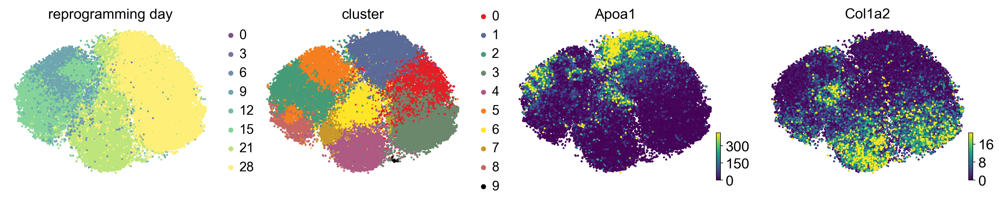

In [13]:
scv.pl.scatter(adata, basis='tsne', color=['reprogramming_day',  'cluster', 'Apoa1', 'Col1a2'], 
             legend_loc='right', perc=[0, 99], size=30, 
               save="umaps_with_annotations.pdf" if save_figure else None)

Show cells for which we have reprogrammign labels given:

saving figure to file /Users/marius/Projects/cellrank_reproducibility_2/figures/fig_4_reprogramming/umap_celltag_labels.pdf


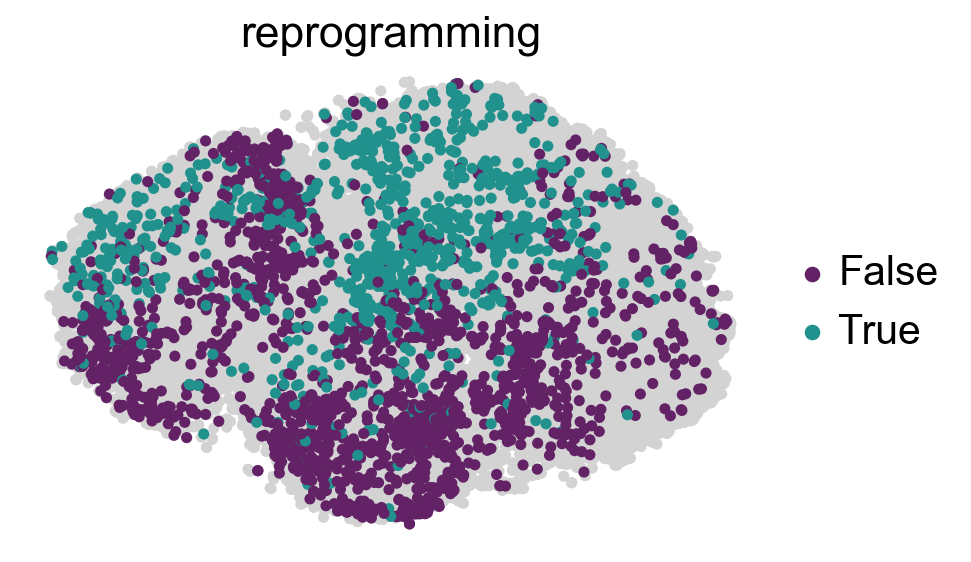

In [14]:
scv.pl.scatter(adata, basis='tsne', color=['reprogramming'], 
             legend_loc='right', size=100, 
               save="umap_celltag_labels.pdf" if save_figure else None)

For how many cells do we have ground-truth labels?

In [15]:
np.sum(~adata.obs['reprogramming'].isna())

3049

## Pre-process the data

### Raw data (for plotting)

In [16]:
adata_raw = adata.copy()
sc.pp.filter_genes(adata_raw, min_cells=10)
scv.pp.normalize_per_cell(adata_raw)
sc.pp.log1p(adata_raw)

# annotate highly variable genes, but don't filter them out
sc.pp.highly_variable_genes(adata_raw)
print(f"This detected {np.sum(adata_raw.var['highly_variable'])} highly variable genes. ")
adata.raw = adata_raw

filtered out 8209 genes that are detected in less than 10 cells
Normalized count data: X, spliced, unspliced.
extracting highly variable genes
    finished (0:00:02)
This detected 1458 highly variable genes. 


### Data for velocity computation

In [17]:
# filter, normalise, log transform
scv.pp.filter_and_normalize(adata, min_shared_counts=20, log=True, n_top_genes=2000)

# compute pca, knn graph and scvelo's moments
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Filtered out 11863 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:27)
computing moments based on connectivities
    finished (0:00:07) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


# scVelo analysis

## Compute velocities using scVelo

In [18]:
n_jobs = 8

# compute/load from cache the dyn. model params and compute velocities
if use_caching:
    c.tl.recover_dynamics(adata, fname='2021-09-23_recover_dynamics', force=force_recompute, n_jobs=n_jobs)
else:
    scv.tl.recover_dynamics(adata)
    
scv.tl.velocity(adata, mode='dynamical', n_jobs=n_jobs)

Loading data from: `2021-09-23_recover_dynamics.pickle`.
computing velocities
    finished (0:02:09) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


## Project velocities onto the embedding

In [19]:
# compute/load from cache the dyn. model params and compute velocities
n_jobs = 8

if use_caching:
    c.tl.velocity_graph(adata, fname='2021-09-23_velocity_graph', force=force_recompute, n_jobs=n_jobs)
else:
    scv.tl.velocity_graph(adata, n_jobs=n_jobs)

Loading data from: `2021-09-23_velocity_graph.pickle`.
`adata.uns` already contains key: `'velocity_graph_neg'`.


computing velocity embedding
    finished (0:00:12) --> added
    'velocity_tsne', embedded velocity vectors (adata.obsm)
figure cannot be saved as pdf, using png instead.
saving figure to file /Users/marius/Projects/cellrank_reproducibility_2/figures/fig_4_reprogramming/umap_velocity.png


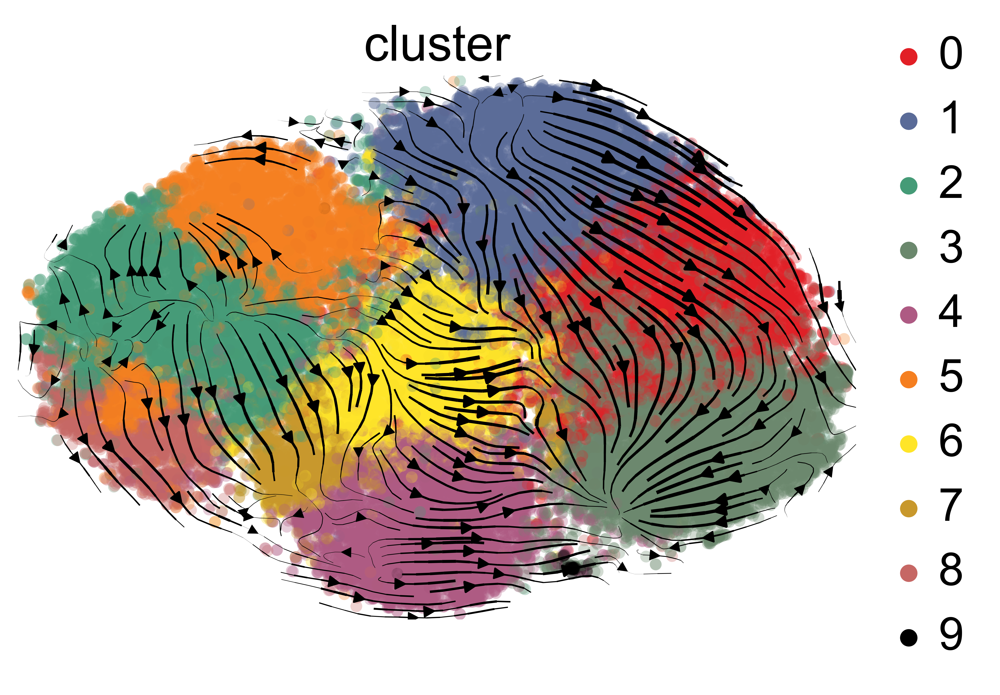

In [20]:
scv.pl.velocity_embedding_stream(adata, basis='tsne', color=['cluster'], legend_loc='right', dpi=500, 
                                save="umap_velocity.pdf" if save_figure else None)

# CellRank analysis

## Initialise kernel and estimator

In [21]:
from cellrank.tl.estimators import GPCCA

# set the parameters we want to use to compute the transition matrix
weight_connectivities=0.2
mode="stochastic" 
n_jobs=8
softmax_scale=None

if use_caching:
    c.tl.transition_matrix(adata, 
                           weight_connectivities=weight_connectivities, 
                           mode=mode, 
                           n_jobs=n_jobs, 
                           softmax_scale=softmax_scale, 
                           fname=f"2021-09-23_transition_matrix_{mode}", 
                           force=force_recompute)
    g_fwd = GPCCA(adata, obsp_key='T_fwd')
else:
    kernel = cr.tl.transition_matrix(adata, 
                                     weight_connectivities=weight_connectivities, 
                                     mode=mode, 
                                     n_jobs=n_jobs, 
                                     softmax_scale=softmax_scale)
    g_fwd = GPCCA(kernel)
    
print(g_fwd)

Loading data from: `2021-09-23_transition_matrix_stochastic.pickle`.
GPCCA[n=48515, kernel=<PrecomputedKernel[origin=adata.obsp['T_fwd']]>]


## Print transition matrix statistics for reproducibility

To make sure that we're using the same transition matrix, show some stats. 

In [22]:
# just for consistency, display some summary staes about the transition matrix
T = adata.obsp['T_fwd']
T_med, T_mean, T_var = np.median(T.data), np.mean(T.data), np.var(T.data)
T_min, T_max = np.min(T.data), np.max(T.data)

print(f'med = {T_med:.6f},\nmean = {T_mean:.6f},\nvar = {T_var:.6f},\nmin = {T_min:.6f},\nmax = {T_max:.6f}')

med = 0.016900,
mean = 0.022668,
var = 0.000388,
min = 0.000000,
max = 0.427753


## Compute the real Schur decomposition

Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[6, 10]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:03)


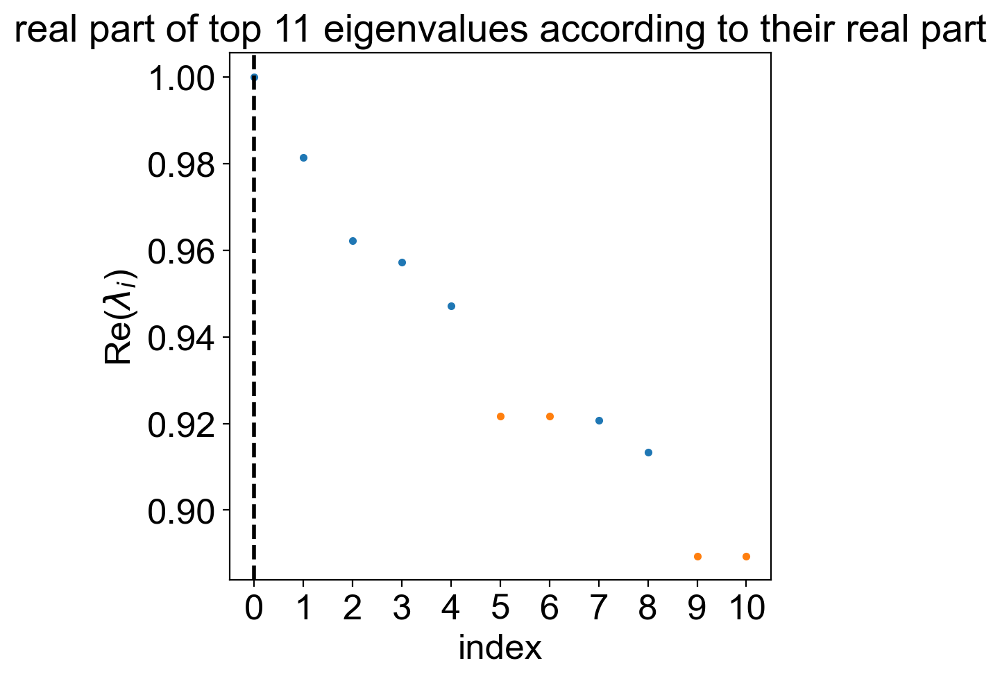

In [23]:
g_fwd.compute_schur()
g_fwd.plot_spectrum(real_only=True)

There's a visible 'gap' after the first 5 eigenvalues, that's an indication that we should be looking for 5 macrostates. 

## Compute macrostates

Computing `5` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:06)
saving figure to file /Users/marius/Projects/cellrank_reproducibility_2/figures/fig_4_reprogramming/umap_macrostates.pdf


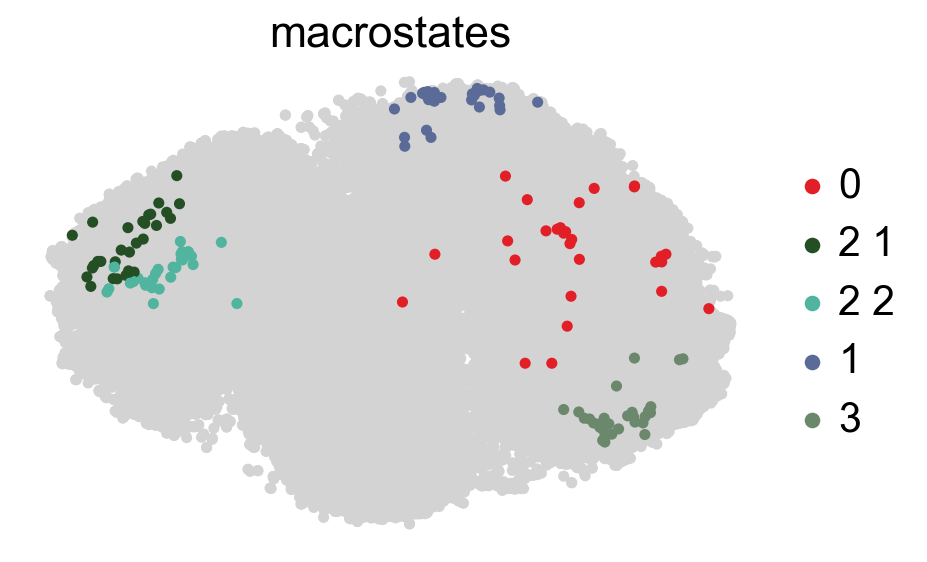

In [24]:
g_fwd.compute_macrostates(n_states=5, cluster_key='cluster')
g_fwd.plot_macrostates(discrete=True, basis='tsne', size=100, legend_loc='right', 
                      save="umap_macrostates.pdf" if save_figure else None)

## Look into these macrostates

Check marker expression in each of them. 

/Users/marius/miniconda3/envs/cellrank/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


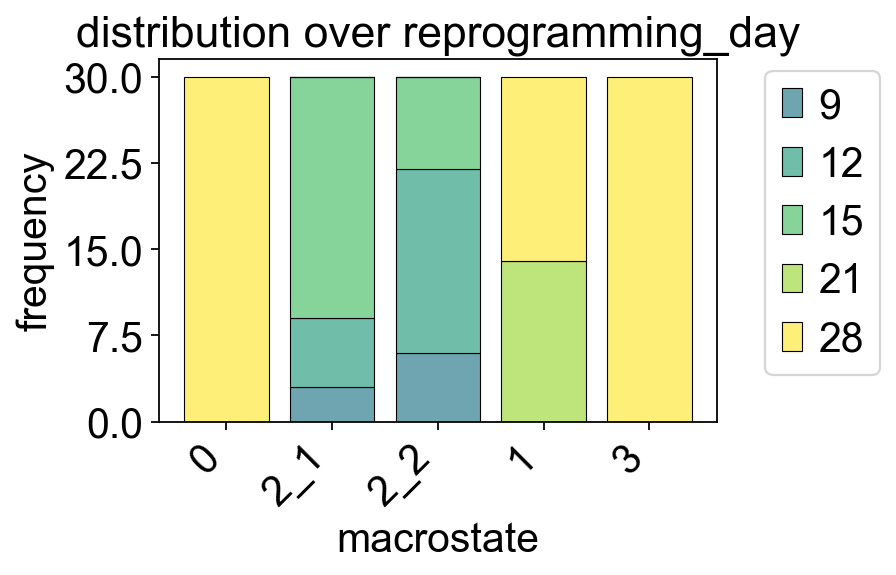

In [25]:
g_fwd.plot_macrostate_composition(key="reprogramming_day", save='histogram_day.pdf' if save_figure else None)

/Users/marius/miniconda3/envs/cellrank/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


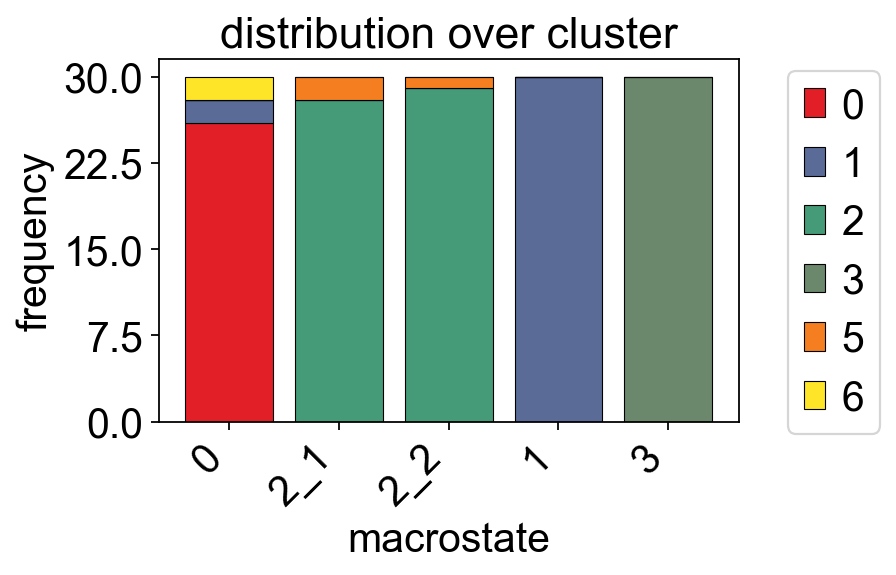

In [26]:
g_fwd.plot_macrostate_composition(key="cluster", save='histogram_cluster.pdf' if save_figure else None)

## Compute absorption probabilities

Set terminal states based on the investigation above. 

In [27]:
successful_state = '1'
dead_end_state = '3'

g_fwd.set_terminal_states_from_macrostates(names=[successful_state, dead_end_state])

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/Users/marius/miniconda3/envs/cellrank/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Compute and plot absorption probabilities towards these

Computing absorption probabilities


  0%|          | 0/2 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)
saving figure to file /Users/marius/Projects/cellrank_reproducibility_2/figures/fig_4_reprogramming/umap_fate_probs.pdf


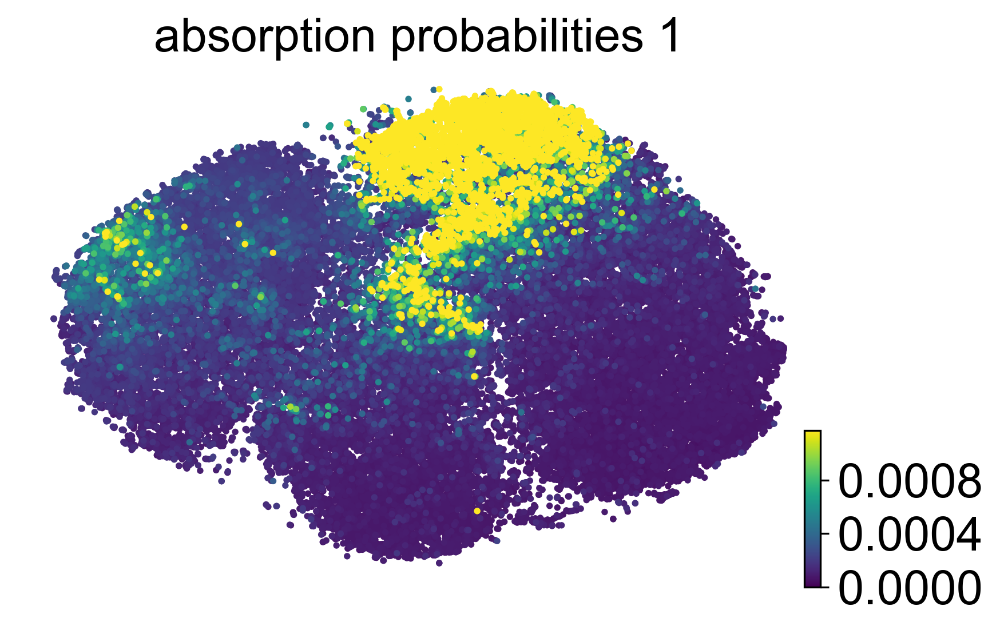

In [28]:
g_fwd.compute_absorption_probabilities(use_petsc=True, solver='gmres')

g_fwd.plot_absorption_probabilities(same_plot=False, basis='tsne', dpi=150,size=30, perc=[0, 94], 
                                states=successful_state, 
                                    save="umap_fate_probs.pdf" if save_figure else None)

Write these to `.obs`

In [29]:
adata.obs['reprogramming_probability'] = adata.obsm['to_terminal_states'][successful_state].X.flatten()
adata.obs['non_reprogramming_probability'] = adata.obsm['to_terminal_states'][dead_end_state].X.flatten()

/Users/marius/miniconda3/envs/cellrank/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Predict reprogramming outcome based on fate probabilities


This selects 374 cells from day 12.
There are 27.81% positive examples. Correcting for class inbalance. 
There are 124/208 training examples and 84/208 testing examples. 

This selects 582 cells from day 15.
There are 26.46% positive examples. Correcting for class inbalance. 
There are 184/308 training examples and 124/308 testing examples. 

This selects 1312 cells from day 21.
There are 24.85% positive examples. Correcting for class inbalance. 
There are 391/652 training examples and 261/652 testing examples. 


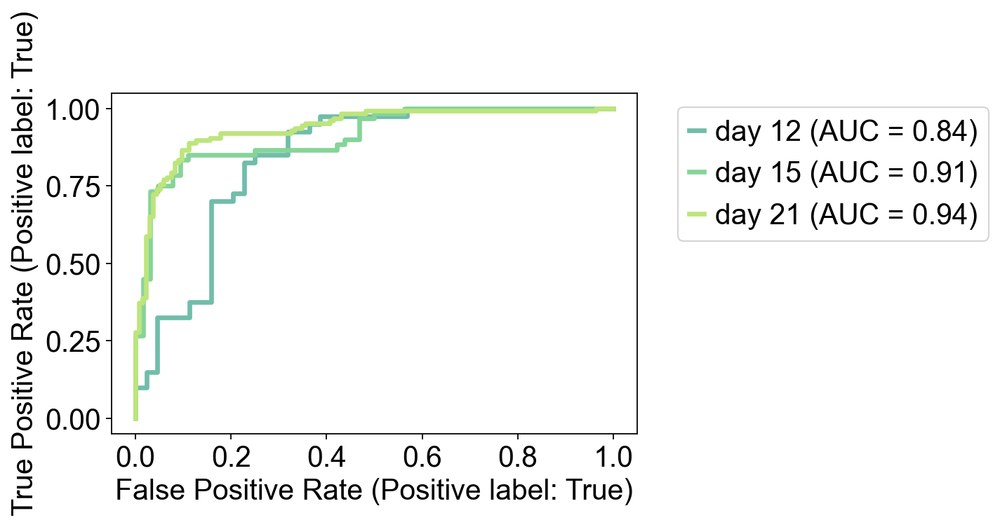

In [30]:
predict_reprogramming_outcome(adata, day_selection=['12', '15', '21'], lw=3,
                              save=FIG_DIR / "roc_curves.pdf" if save_figure else None)